In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


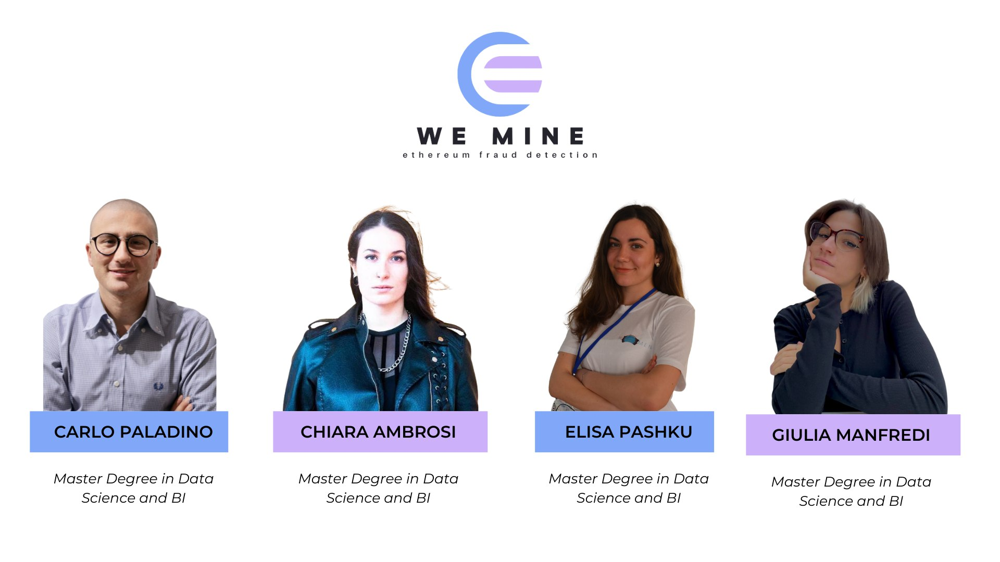

In [4]:
# Importing the libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# FROM THE PREVIOUS MIDTERM...

The dataset chosen for the classification is the 14 features dataset and the best method is Random Forest Classifier, therefore, the explanation will be done on that.

Three dummy classifiers have been built to be sure and to demonstrate that Random Forest performs the best:

1.   Dummy Classifier, that classifies just the rare class (Fraud, 1);
2.   Dummy Classifier, that classifies just the majority class (Non Fraud, 0);
3.   Dummy Classifier with strategy "stratified", that generates predictions by respecting the training set's class distribution.
4.   Random Forest Classifier, with parameters resulting from the GridSearchCV previously done.

Each of them has been built on the train set and evaluated on the test set with four metrics: balanced accuracy, f1 score, precision and recall.

**Dummy Classifiers**

In [5]:
# read the dataset
# Loading the dataset then showing the shape of the dataset and the first five rows of it
df = pd.read_csv("/content/drive/MyDrive/Jovian/ethereum-fraud-detection/14_df.csv", index_col=0)
print(df.shape)
df.head()

(9374, 14)


,Avg min between received tnx,Sent tnx,Unique Received From Addresses,max value received,total ether received,Total ERC20 tnxs,ERC20 uniq sent addr,ERC20 max val rec,ERC20 min val sent,ERC20 max val sent,ERC20 most sent token type,ERC20_most_rec_token_type,Time Diff between first and last tnx (Days),Fraud
1,2958.44,94,5,2.613269,3.085478,8.0,1.0,365.00000,2.260809,2.260809,154,257,845,0
2,2434.02,2,10,1.165453,3.589057,8.0,0.0,442.81984,0.000000,0.000000,185,436,358,0
3,15785.09,25,7,500.000000,895.399559,14.0,2.0,11412.23068,100.000000,9029.230680,217,436,276,0
5,375.48,2,2,4.813776,9.704724,0.0,0.0,0.00000,0.000000,0.000000,4,3,14,0
6,629.44,25,9,2.650000,12.079266,0.0,0.0,0.00000,0.000000,0.000000,4,3,6,0


**Dummy Classifier that classifies just the rare class (Fraud, 1)**

In [6]:
from sklearn.dummy import DummyClassifier

In [7]:
Y = df['Fraud']
X = df.drop(['Fraud'], axis=1)

In [8]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)

In [9]:
dummy_clf = DummyClassifier(strategy="constant", constant=[1], random_state=0)
dummy_clf.fit(X_train, Y_train)

DummyClassifier(constant=[1], random_state=0, strategy='constant')

In [10]:
from sklearn.metrics import *

y_pred_dummy = dummy_clf.predict(X_test)
y_pred_tr_dummy = dummy_clf.predict(X_train)

print('Train Accuracy %s' % accuracy_score(Y_train, y_pred_tr_dummy))
print('Train F1-score %s' % f1_score(Y_train, y_pred_tr_dummy, average='weighted'))
print('Train Precision %s' % precision_score(Y_train, y_pred_tr_dummy, average='weighted'))
print('Train Recall %s' % recall_score(Y_train, y_pred_tr_dummy, average='weighted'))
print()

print('Test Accuracy %s' % accuracy_score(Y_test, y_pred_dummy))
print('Test F1-score %s' % f1_score(Y_test, y_pred_dummy, average='weighted'))
print('Test Precision %s' % precision_score(Y_test, y_pred_dummy, average='weighted'))
print('Test Recall %s' % recall_score(Y_test, y_pred_dummy, average='weighted'))

Train Accuracy 0.23319615912208505
Train F1-score 0.08819432046886419
Train Precision 0.05438044862929281
Train Recall 0.23319615912208505

Test Accuracy 0.2307145396373978
Test F1-score 0.08650129186867196
Test Precision 0.0532291988000964
Test Recall 0.2307145396373978


**Dummy Classifier, that classifies just the majority class (Non Fraud, 0)**

In [11]:
dummy_clf = DummyClassifier(strategy="constant", constant=[0], random_state=0)
dummy_clf.fit(X_train, Y_train)

DummyClassifier(constant=[0], random_state=0, strategy='constant')

In [12]:
y_pred_dummy = dummy_clf.predict(X_test)
y_pred_tr_dummy = dummy_clf.predict(X_train)

print('Train Accuracy %s' % accuracy_score(Y_train, y_pred_tr_dummy))
print('Train F1-score %s' % f1_score(Y_train, y_pred_tr_dummy, average='weighted'))
print('Train Precision %s' % precision_score(Y_train, y_pred_tr_dummy, average='weighted'))
print('Train Recall %s' % recall_score(Y_train, y_pred_tr_dummy, average='weighted'))
print()

print('Test Accuracy %s' % accuracy_score(Y_test, y_pred_dummy))
print('Test F1-score %s' % f1_score(Y_test, y_pred_dummy, average='weighted'))
print('Test Precision %s' % precision_score(Y_test, y_pred_dummy, average='weighted'))
print('Test Recall %s' % recall_score(Y_test, y_pred_dummy, average='weighted'))

Train Accuracy 0.766803840877915
Train F1-score 0.6655952593955814
Train Precision 0.5879881303851228
Train Recall 0.766803840877915

Test Accuracy 0.7692854603626023
Test F1-score 0.6689707599858032
Test Precision 0.5918001195253009
Test Recall 0.7692854603626023


**Dummy Classifier with "stratified" strategy, that generates predictions by respecting the training set's class distribution**

In [13]:
dummy_clf = DummyClassifier(strategy="stratified", random_state=0)
dummy_clf.fit(X_train, Y_train)

DummyClassifier(random_state=0, strategy='stratified')

In [14]:
y_pred_dummy = dummy_clf.predict(X_test)
y_pred_tr_dummy = dummy_clf.predict(X_train)

print('Train Accuracy %s' % accuracy_score(Y_train, y_pred_tr_dummy))
print('Train F1-score %s' % f1_score(Y_train, y_pred_tr_dummy, average='weighted'))
print('Train Precision %s' % precision_score(Y_train, y_pred_tr_dummy, average='weighted'))
print('Train Recall %s' % recall_score(Y_train, y_pred_tr_dummy, average='weighted'))
print()

print('Test Accuracy %s' % accuracy_score(Y_test, y_pred_dummy))
print('Test F1-score %s' % f1_score(Y_test, y_pred_dummy, average='weighted'))
print('Test Precision %s' % precision_score(Y_test, y_pred_dummy, average='weighted'))
print('Test Recall %s' % recall_score(Y_test, y_pred_dummy, average='weighted'))

Train Accuracy 0.6381649138850785
Train F1-score 0.6380000033447971
Train Precision 0.6378354561788836
Train Recall 0.6381649138850785

Test Accuracy 0.6509065055101315
Test F1-score 0.6544964098587119
Test Precision 0.6582993694904212
Test Recall 0.6509065055101315


After that, **K-Nearest Neighbors** has been performed with a lower value of K (K = 5), to check if it would improve the performances. The result in terms of F1-score is 0.9615 (+/- 0.005), still worse in performances than Random Forest.

For a more specific analysis, **Random Undersampling** has been done on the majority class and the minority class of the undersampled dataset has been oversampled with **SMOTE**. The resulting dataset gave a F1-score of 0.9823 (+/- 0.003), still a little bit lower than the Random Forest result.

In conclusion, it has been demonstrated that Random Forest performs the best on the 14 festures dataset, so explanation has been performed on it.

**Random Forest Classifier, with parameters resulting from the GridSearchCV previously done**:

*   max_depth = 11;
*   min_samples_split = 10;
*   min_samples_leaf = 10;
*   criterion = entropy.

In [15]:
model = RandomForestClassifier(max_depth=11, random_state=42, min_samples_split=10, min_samples_leaf=10, criterion="entropy")
model.fit(X_train, Y_train)

RandomForestClassifier(criterion='entropy', max_depth=11, min_samples_leaf=10,
                       min_samples_split=10, random_state=42)

In [16]:
y_pred = model.predict(X_test)
y_pred_tr = model.predict(X_train)

print('Train Accuracy %s' % accuracy_score(Y_train, y_pred_tr))
print('Train F1-score %s' % f1_score(Y_train, y_pred_tr, average='weighted'))
print('Train Precision %s' % precision_score(Y_train, y_pred_tr, average='weighted'))
print('Train Recall %s' % recall_score(Y_train, y_pred_tr, average='weighted'))
print()

print('Test Accuracy %s' % accuracy_score(Y_test, y_pred))
print('Test F1-score %s' % f1_score(Y_test, y_pred, average='weighted'))
print('Test Precision %s' % precision_score(Y_test, y_pred, average='weighted'))
print('Test Recall %s' % recall_score(Y_test, y_pred, average='weighted'))

Train Accuracy 0.9920743789056546
Train F1-score 0.9920375825407682
Train Precision 0.9921051324095533
Train Recall 0.9920743789056546

Test Accuracy 0.9896907216494846
Test F1-score 0.9896249841517047
Test Precision 0.9897487416585788
Test Recall 0.9896907216494846


In [17]:
for importance, feature in sorted(zip(model.feature_importances_, X.columns), reverse=True):
  print(round(importance, 2), feature)

0.32  ERC20 most sent token type
0.22  Total ERC20 tnxs
0.09 total ether received
0.08 Time Diff between first and last tnx (Days)
0.07 Unique Received From Addresses
0.06 max value received 
0.05  ERC20_most_rec_token_type
0.04 Avg min between received tnx
0.04  ERC20 max val rec
0.02 Sent tnx
0.01  ERC20 uniq sent addr
0.01  ERC20 max val sent
0.0  ERC20 min val sent


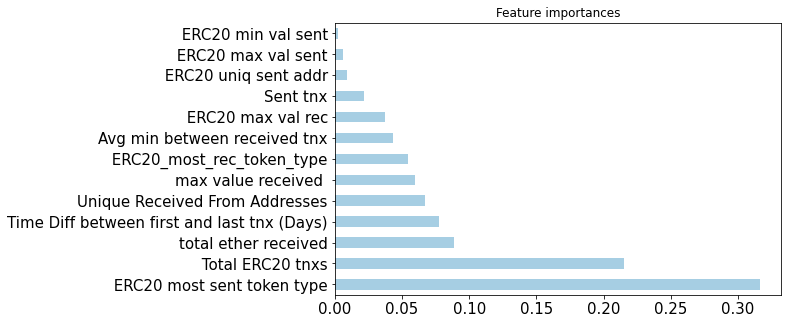

In [18]:
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(13).plot(kind='barh', title="Feature importances", figsize=(8,5), fontsize=15, colormap="Paired")
plt.show()

# THIRD MIDTERM
The aim of this part of the project is to understand by using the SHAP explainer how the dataset's features contribute to the classification, especially if they identify the class as a fraud, so if an account has made fraudulent transactions.

In particular, it will be shown that the attributes will lead toward a class depending on their value, not as a general rule (a specific attribute will not just predict a fraud or a non fraud, but the output will change depending on the value of that feature).

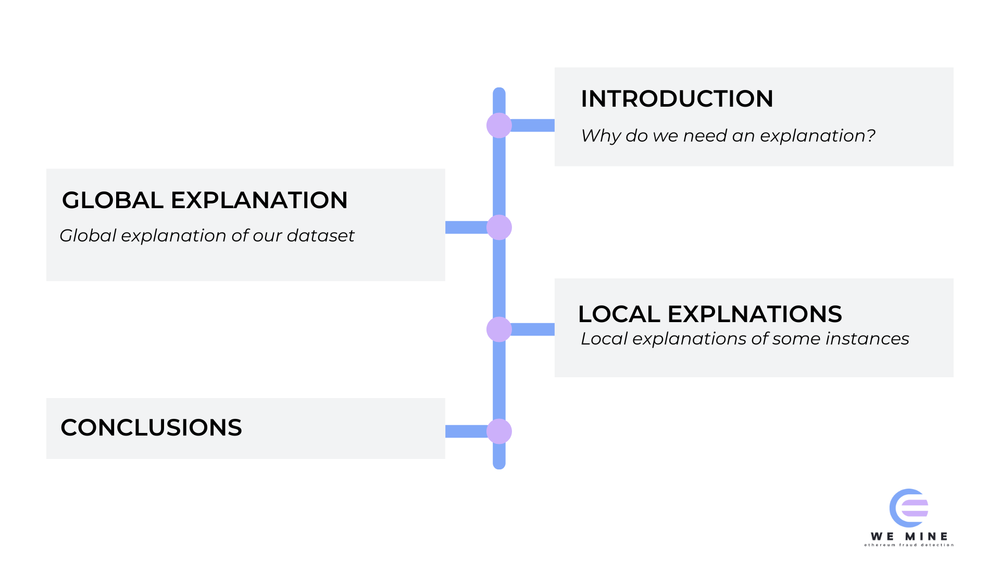

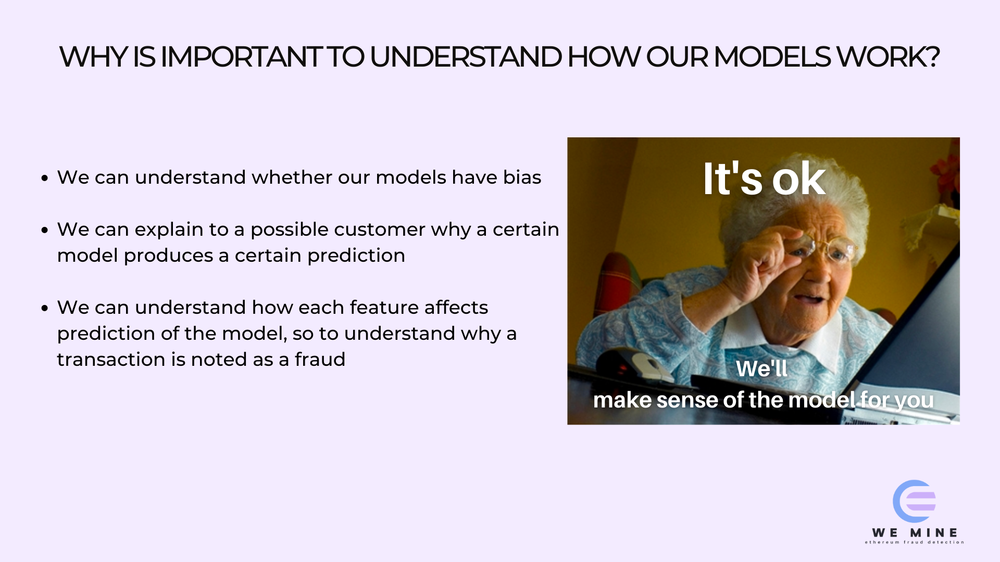

# EXPLANATION WITH SHAP
In this section the explanation of the Random Forest Classifier has been done both globally and locally using SHAP to better understand the contribution of each attribute.

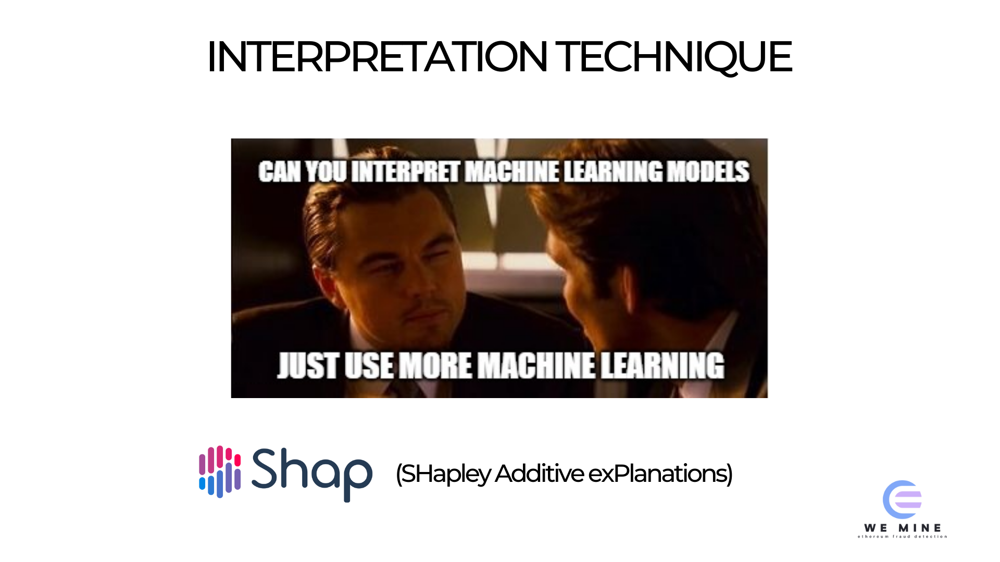

In [19]:
!pip install shap

     |████████████████████████████████| 564 kB 4.2 MB/s 


In [20]:
import shap

## GLOBAL EXPLANATION

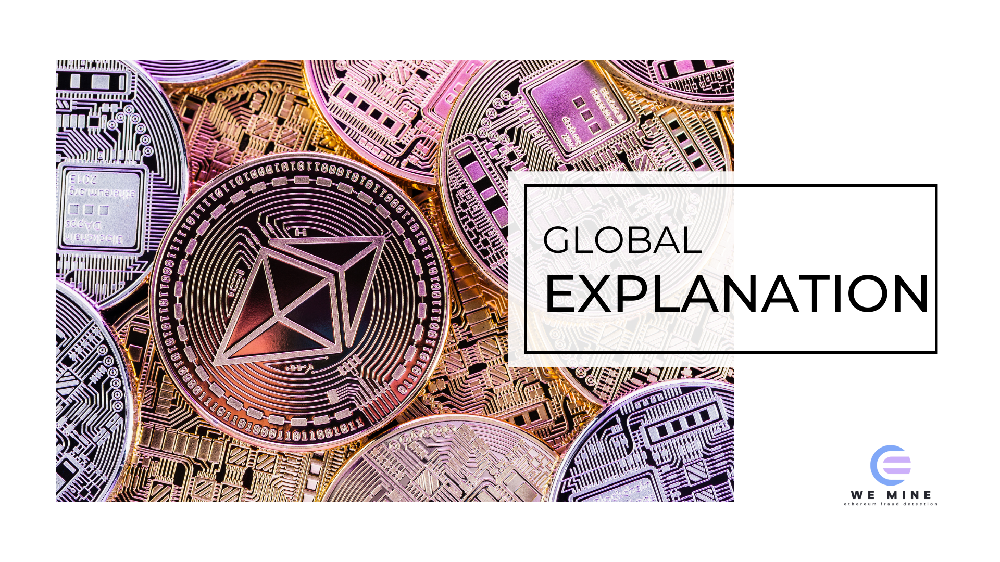

In [21]:
explainer = shap.TreeExplainer(model)
rf_shap_values = explainer.shap_values(X_train)
# The shap_values object above is a list with two arrays. The first array is the SHAP values for a negative outcome, 
# and the second array is the list of SHAP values for the positive outcome. We typically think about 
# predictions in terms of the prediction of a positive outcome, so we'll pull out SHAP values for positive outcomes (pulling out shap_values[1]).

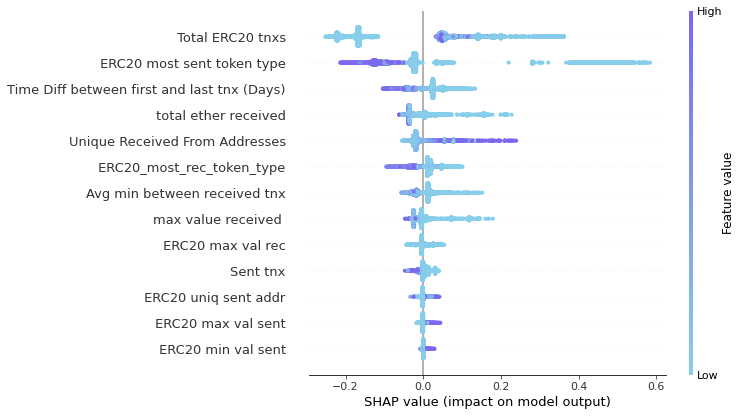

In [22]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

RGB_val = 255

color01= (135,206,235)  # magenta wanted
color04= (123,104,238)  # light blue wanted
Colors = [color01, color04]

# Creating a blue red palette transition for graphics
Colors= [(R/RGB_val,G/RGB_val,B/RGB_val) for idx, (R,G,B) in enumerate(Colors)]
n = 256

# Start of the creation of the gradient
Color01= ListedColormap(Colors[0], name='Color01', N=None)
Color04= ListedColormap(Colors[1], name='Color04', N=None)
top = cm.get_cmap(Color01,128)
bottom = cm.get_cmap(Color04,128)
newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))

mymin0 = newcolors[0][0]
mymin1 = newcolors[0][1]
mymin2 = newcolors[0][2]
mymin3 = newcolors[0][3]
mymax0 = newcolors[255][0]
mymax1 = newcolors[255][1]
mymax2 = newcolors[255][2]
mymax3 = newcolors[255][3]

GradientBlueRed= [np.linspace(mymin0, mymax0,  n),
                   np.linspace(mymin1, mymax1,  n),
                   np.linspace(mymin2, mymax2,  n),
                   np.linspace(mymin3, mymax3,  n)]

GradientBlueRed_res =np.transpose(GradientBlueRed)
newcmp = ListedColormap(GradientBlueRed_res, name='BlueRed')

# Plot the summary without showing it
plt.show()
shap.summary_plot(rf_shap_values[1], X_train, show=False)

# Change the colormap of the artists
for fc in plt.gcf().get_children():
    for fcc in fc.get_children():
        if hasattr(fcc, "set_cmap"):
            fcc.set_cmap(newcmp)

Overall the lowest values bring higher shap importances, except for Unique Received From Addresses and ERC20 max and min val sent.
So, high values of these specific attributes contribute positively, instead the highest values of the other features contribute negatively.

As it was highlighted in pattern mining from the previous notebook, where the highest confidence came from the lowest values for some attributes (such as Time Diff between first and last tnx (Days)), in the graph above the lowest values have higher shap importances, meaning that contribute a lot for the classification in general, so to train the model helping for the classification of both classes.

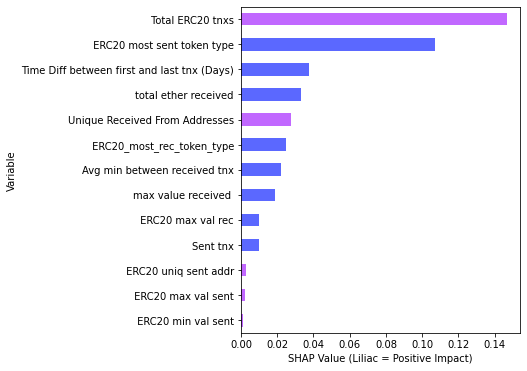

In [23]:
def simple_SHAP(df_shap, df):
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns  = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'#C168FF','#5B68FF')
    
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable', how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(5,6),legend=False)
    ax.set_xlabel("SHAP Value (Liliac = Positive Impact)")
    
simple_SHAP(rf_shap_values[1], X_train)

#almost the same importances as before, but now we can see the impact 


The graphic above shows the impact on the model output of each attribute. The purple bars indicate a positive impact, the blue bars a negative one. Total ER20 tnxs is the feature with the highest impact and it is positively correlated to the target variable, so it helps the classification towards 1, so for identifying the fraudulent accounts.

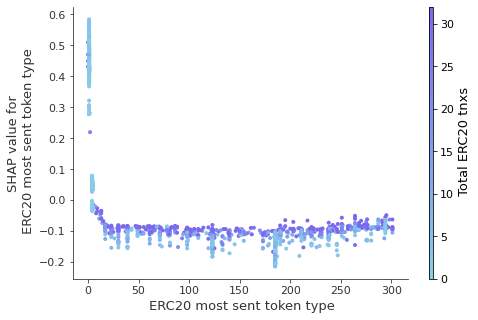

In [ ]:
plt.show()
shap.dependence_plot(" ERC20 most sent token type", rf_shap_values[1], X_train, show=False)
# Change the colormap of the artists
for fc in plt.gcf().get_children():
    for fcc in fc.get_children():
        if hasattr(fcc, "set_cmap"):
            fcc.set_cmap(newcmp)

It can be seen that for low values of ERC20 most sent token type and Total ERC20 tnxs there are a higher shap values, so these values influence more the classification.

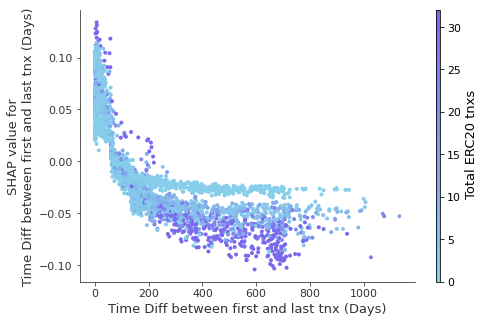

In [ ]:
plt.show()
shap.dependence_plot("Time Diff between first and last tnx (Days)", rf_shap_values[1], X_train, show=False)
# Change the colormap of the artists
for fc in plt.gcf().get_children():
    for fcc in fc.get_children():
        if hasattr(fcc, "set_cmap"):
            fcc.set_cmap(newcmp)

The lower the Time diff between first and last tnx (Days) and Total ERC20 tnxs values are, the higher the shap values are for the first attribute, so it impacts positively on the model output. 

There is a peak for low values of Time diff between first and last tnx (Days) that highlights the fact that lower ranges of that attribute contribute more for the classification. Almost all the points are blue, meaning that Total ERC20 contributes a lot with lower values, but it can be seen at the top the points are purple, so even if the number of points is smaller, also higher values of Total ERC20 tnxs contribute significantly.

The growth is approximately logaritmic and the relationship between Time diff between first and last tnx (Days) and the target variable is negative, as it can be seen in the graphic above and in the previous one. 

# LOCAL EXPLANATION

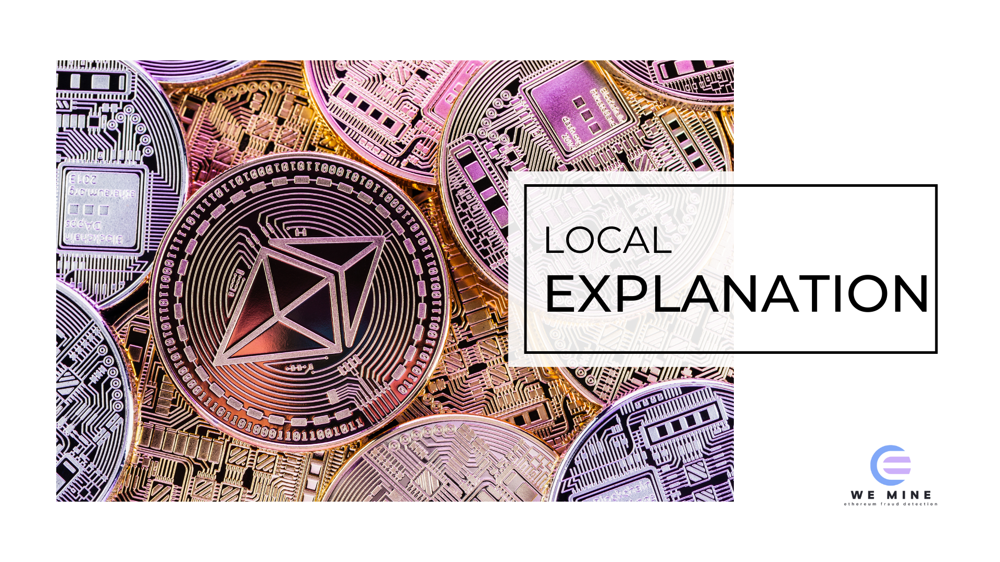

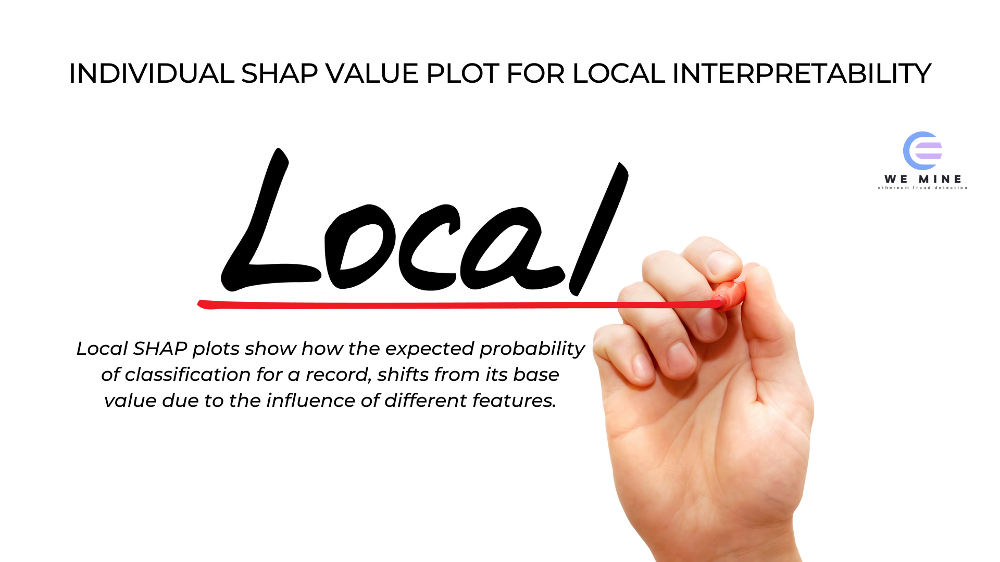

In [ ]:
# Created to make waterfall_plot work, that otherwise wouldn't find some of these values
class ShapObject: 
  def __init__(self, base_values, data, values, feature_names):
      self.base_values = base_values # Single value
      self.data = data # Raw feature values for 1 row of datas
      self.values = values # SHAP values for the same row of data
      self.feature_names = feature_names # Column names

In [ ]:
values = explainer.shap_values(X_test)[1]

**1st Record**

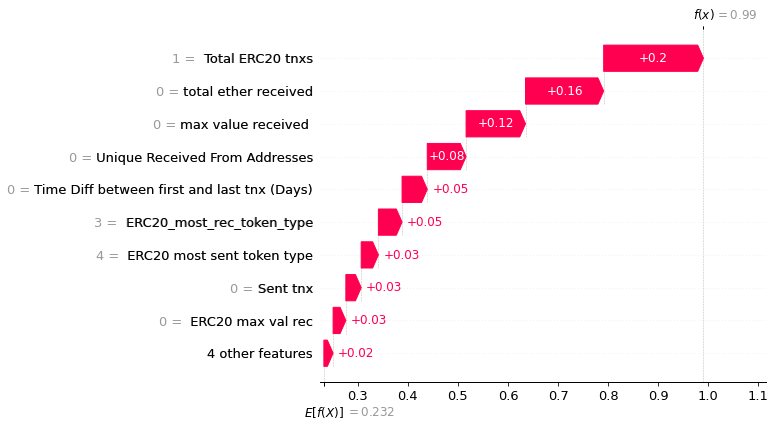

In [ ]:
shap_object = ShapObject(base_values = explainer.expected_value[1],
                         values = values[0],
                         feature_names = X.columns,
                         data = X_test.iloc[0])
shap.waterfall_plot(shap_object)

In the plot above it can be seen that in the first record of the test set, Total ERC20 tnxs is the feature with the highest positive importance, as previously shown in the global explanation. 

In this case all the feature contribute positively to the classification of the record and their values are all low, as it was highlighted in the Summary Plot.

In [ ]:
print(Y_test.iloc[0], y_pred[0])

1 1


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], values[0], X_test.iloc[0], plot_cmap=['#C168FF','#5B68FF'])

In [ ]:
raw = pd.read_csv("/content/drive/MyDrive/Jovian/ethereum-fraud-detection/transaction_dataset.csv", index_col=0)
raw = raw.drop_duplicates()
# Create a dictionary with columns as keys and its number of missing values
d = dict(raw.isnull().sum())
# For every column if the number of missing values is greater than 0 i append the name of the column in the list l
l=[]
for i in d.keys():
  if d[i] > 0:
    l.append(i)
# For every column in the list l, if it's numerical the missing values are replaced by the median
# Instead for the categorical variables, the missing values are replaced by the mode
for col in l[:-2]:
  raw[col] = raw[col].fillna(raw[col].median())
for col in l[-2:]:
  raw[col] = raw[col].fillna(raw[col].mode()[0])

In [ ]:
X_test.iloc[0]

Avg min between received tnx                   0.0
Sent tnx                                       0.0
Unique Received From Addresses                 0.0
max value received                             0.0
total ether received                           0.0
 Total ERC20 tnxs                              1.0
 ERC20 uniq sent addr                          0.0
 ERC20 max val rec                             0.0
 ERC20 min val sent                            0.0
 ERC20 max val sent                            0.0
 ERC20 most sent token type                    4.0
 ERC20_most_rec_token_type                     3.0
Time Diff between first and last tnx (Days)    0.0
Name: 9350, dtype: float64

In [ ]:
raw[" ERC20 most sent token type"].iloc[9350]

'0'

**2nd Record**

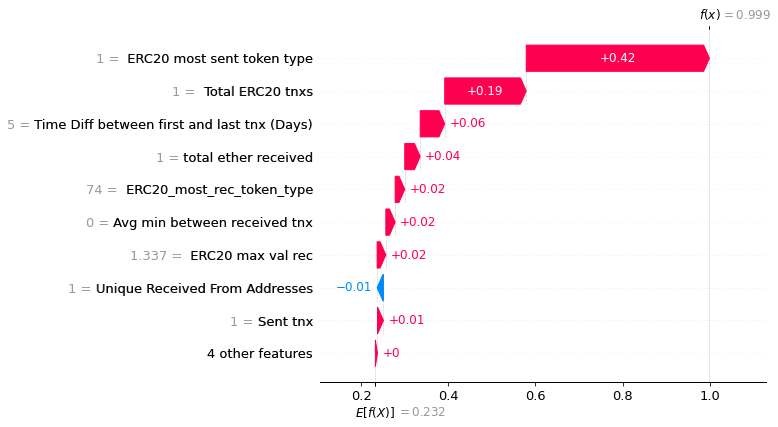

In [ ]:
shap_object = ShapObject(base_values = explainer.expected_value[1],
                         values = values[1],
                         feature_names = X.columns,
                         data = X_test.iloc[1])
shap.waterfall_plot(shap_object)

Here the highest contribution is given by ERC20 most sent token type, which is the second most important in the global explanation after Total ERC20 tnxs. This attribute has a high importance for the classification of the record, which is classificated as a fraudulent account, so this means that also the type of the sent token in the transaction could help identifying the frauds.

Even in this case almost every feature contributes positively to the classification of the record, except Unique Received From Addresses, which however had a positive contribution in the Simplified Plot shown before.


In [ ]:
print(Y_test.iloc[1], y_pred[1])

1 1


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], values[1], X_test.iloc[1], plot_cmap=['#C168FF','#5B68FF'])

In [ ]:
X_test.iloc[1]

Avg min between received tnx                    0.000
Sent tnx                                        1.000
Unique Received From Addresses                  1.000
max value received                              1.000
total ether received                            1.000
 Total ERC20 tnxs                               1.000
 ERC20 uniq sent addr                           0.000
 ERC20 max val rec                              1.337
 ERC20 min val sent                             0.000
 ERC20 max val sent                             0.000
 ERC20 most sent token type                     1.000
 ERC20_most_rec_token_type                     74.000
Time Diff between first and last tnx (Days)     5.000
Name: 8827, dtype: float64

In [ ]:
raw[" ERC20 most sent token type"].iloc[8827]

' '

**3rd Record**

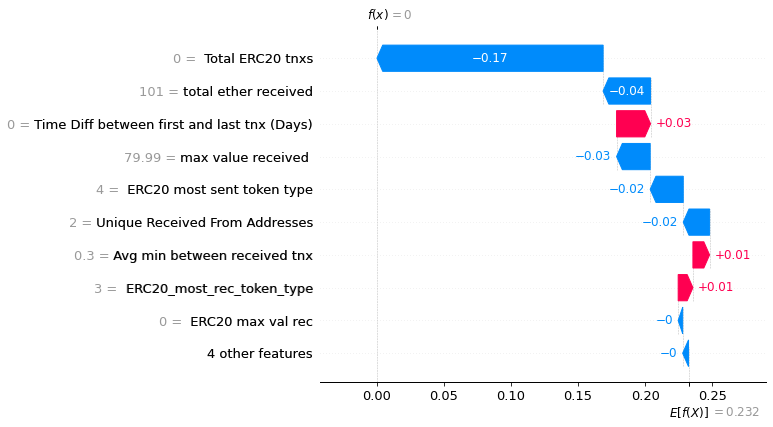

In [ ]:
shap_object = ShapObject(base_values = explainer.expected_value[1],
                         values = values[2],
                         feature_names = X.columns,
                         data = X_test.iloc[2])
shap.waterfall_plot(shap_object)

This plot shows how the third record is classified as a non fraud. 
Total ERC20 tnxs is the attribute that decides the output since its shap value is -0.17 (considering that base value is 0.232), while the other attributes do not have a noticeable impact on the classification of the record.

It is interesting seeing how Total ERC20 tnxs has a high contribution for the decision of both classes: here it helps classfying the record as a non fraud, while in the first two records the class identified was a fraud. 

It can also be seen how not all low values lead to a fraud classification, but specific values bring to different output. For the first two records 1 was the triggering value for the fraud, while here it's 0 and it has a high importance to classify the class as a non fraud.

In [ ]:
print(Y_test.iloc[2], y_pred[2])

0 0


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], values[2], X_test.iloc[2], plot_cmap=['#C168FF','#5B68FF'])

In [ ]:
X_test.iloc[2]

Avg min between received tnx                     0.300000
Sent tnx                                         3.000000
Unique Received From Addresses                   2.000000
max value received                              79.989869
total ether received                           101.000000
 Total ERC20 tnxs                                0.000000
 ERC20 uniq sent addr                            0.000000
 ERC20 max val rec                               0.000000
 ERC20 min val sent                              0.000000
 ERC20 max val sent                              0.000000
 ERC20 most sent token type                      4.000000
 ERC20_most_rec_token_type                       3.000000
Time Diff between first and last tnx (Days)      0.000000
Name: 3340, dtype: float64

In [ ]:
raw[" ERC20 most sent token type"].iloc[3340]

'0'

**4th Record**

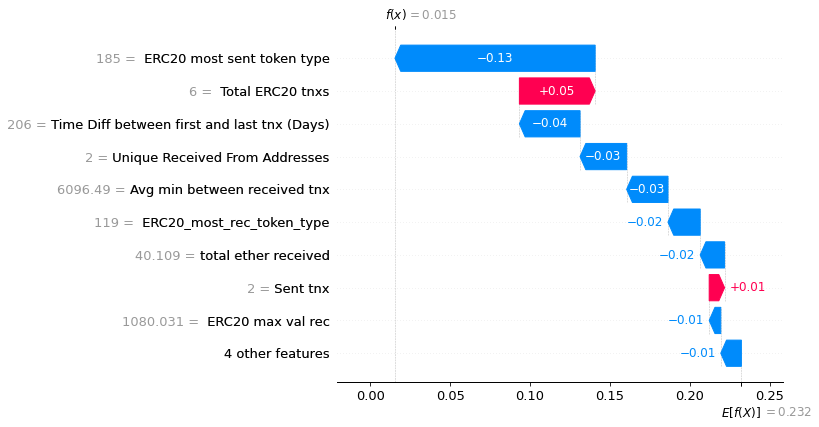

In [ ]:
shap_object = ShapObject(base_values = explainer.expected_value[1],
                         values = values[3],
                         feature_names = X.columns,
                         data = X_test.iloc[3])
shap.waterfall_plot(shap_object)

Here, the most influencing attributes are ERC20 most sent token type and Total ERC20 tnxs and, as it was shown in the global explanation, the first one negatively contributes to the classification, while the second one positively. However, the negative contribution has a higher shap value that leads to the classification of the record as a non fraud. 

In [ ]:
print(Y_test.iloc[3], y_pred[3])

0 0


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], values[3], X_test.iloc[3], plot_cmap=['#C168FF','#5B68FF'])

In [ ]:
X_test.iloc[3]

Avg min between received tnx                   6096.490000
Sent tnx                                          2.000000
Unique Received From Addresses                    2.000000
max value received                                7.395000
total ether received                             40.108725
 Total ERC20 tnxs                                 6.000000
 ERC20 uniq sent addr                             0.000000
 ERC20 max val rec                             1080.031292
 ERC20 min val sent                               0.000000
 ERC20 max val sent                               0.000000
 ERC20 most sent token type                     185.000000
 ERC20_most_rec_token_type                      119.000000
Time Diff between first and last tnx (Days)     206.000000
Name: 6928, dtype: float64

In [ ]:
raw[" ERC20 most sent token type"].loc[6928]

'None'

**5th Record**

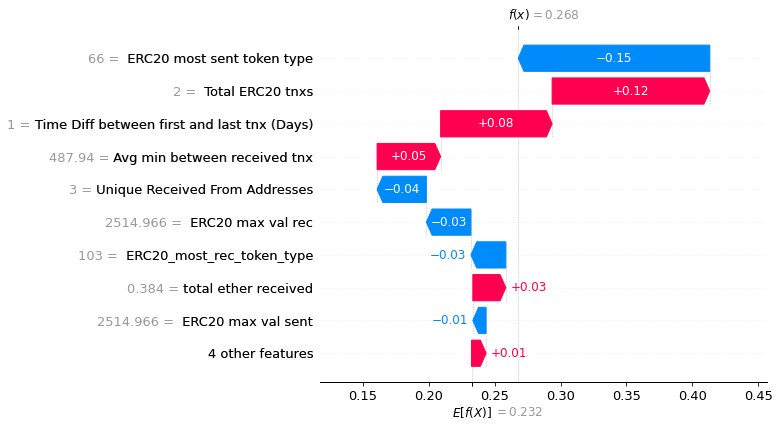

In [ ]:
shap_object = ShapObject(base_values = explainer.expected_value[1],
                         values = values[27],
                         feature_names = X.columns,
                         data = X_test.iloc[27])
shap.waterfall_plot(shap_object)

Considering the rules previously extracted from Pattern Mining, since the value of Time Diff between first and last tnx (Days) is 1, it could be assumed that the account will be a fraud, but it's the value of ERC20 most sent token type (a feature with high importance) that makes this record classified as a non fraud.

In [ ]:
print(Y_test.iloc[27], y_pred[27])

1 0


Here the record is classified as a non fraud, but the real class is instead a fraud. This could be because that the majority of frauds has as the ERC20 most sent token type an unidentifiable token, such as " " (assumed by the Pattern Mining previously done). In this case there is an identifiable one, that is "CoinDash", so the classifier could assume that this is a non fraud considering this type of token.

Actually, "CoinDash" token type could be considered as a "fraudulent" type as shown in [this article](https://www.coindesk.com/markets/2017/07/17/7-million-lost-in-coindash-ico-hack/) and proved by the Y_test result. So in this case the classifier has wrongly predicted the class, but the local explanation has shown that it is due to the fact that ERC20 most sent token type has a high negative impact on the classification of that record.

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], values[27], X_test.iloc[27], plot_cmap=['#C168FF','#5B68FF'])

In [ ]:
X_test.iloc[27]

Avg min between received tnx                    487.940000
Sent tnx                                          7.000000
Unique Received From Addresses                    3.000000
max value received                                0.234000
total ether received                              0.384000
 Total ERC20 tnxs                                 2.000000
 ERC20 uniq sent addr                             1.000000
 ERC20 max val rec                             2514.965579
 ERC20 min val sent                            2514.965579
 ERC20 max val sent                            2514.965579
 ERC20 most sent token type                      66.000000
 ERC20_most_rec_token_type                      103.000000
Time Diff between first and last tnx (Days)       1.000000
Name: 8873, dtype: float64

In [ ]:
raw[" ERC20 most sent token type"].loc[8873]

'CoinDash'

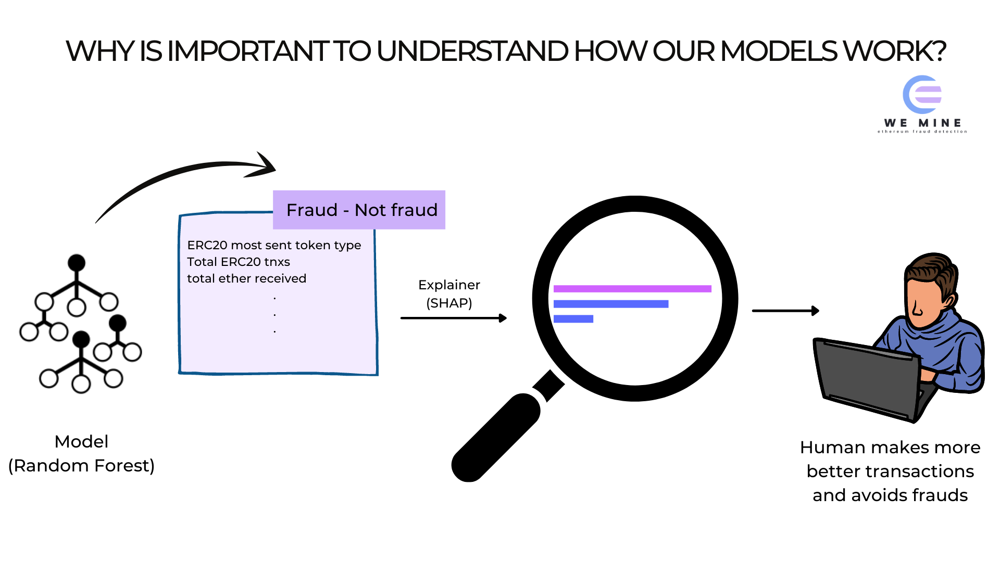

# Conclusions

Among all the attributes, Total ERC20 tnxs and ERC20 most sent token type are the most important for the classification, as shown in the global explanation. Depending on their values they could lead to both classes (fraud or non fraud) and they are the most important factors for a good classification, regardless of the specific output.

Their values have a really strong influence with the prediction of the class, especially if the Total ERC20 tnxs is 0 the record will be a non fraud, while if it is 1 or higher it will be a fraud.

Even if Time Diff between first and last tnx (Days) has not much importance as the first two attributes, it shows contistent results by leading towards frauds when its values are low and towards non frauds otherwise (as it was shown in the Pattern Mining from the previous notebook).

Depending on the ERC20 most sent token type it is easier to classify a record as a fraud or not: for example if the token is not specified the attribute will have a high shap value for classifying the record as a fraud (as it was already shown in the Pattern Mining task).

The other attributes do not contribute as much for predicting the class.



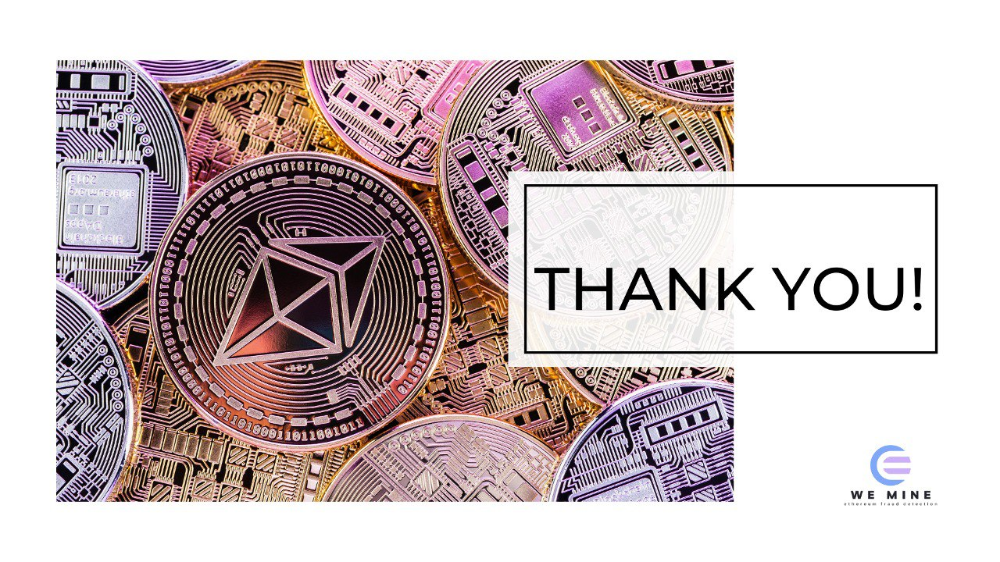

In [ ]:
import pickle

In [ ]:
# save the model to disk
filename = 'finalized_model.sav'
pickle.dump(model, open(filename, 'wb'))

In [ ]:
# Execute this to save new versions of the notebook
jovian.commit(project="third-mid-term")

[jovian] Detected Colab notebook...
[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: 